# Solar field model calibration

Notebook to calibrate the solar field direct and inverse model. 

For the direct model (flow as input), outlet temperature as an output. Three scenarios are tested:

1. Calibration and performance of the model in best conditions: fast sample time and water properties estimated per sample.
2. Performance of the model when water properties are kept constant throught the simulation.
3. Performance of the model when sample time is decreased. 

~~On the other hand, for the inverse model (takes a temperature as an input and estimates the flow that would produce it):~~

~~1. Calibration and performance evaluation of the model in best conditions comparing: PID implementation, fsolve.~~
~~Performance of the model when water properties are kept constant throught the simulation.~~
~~3. Performance of the model when sample time is decreased~~


**Version history**

- **202410087**. Re-factored to use preprocessing from module, added `evaluate_model` utility function and benchmark support.
- **Version 20240308**: beta: 4.36396e-02, H: 13.676448551722462, gamma: 0.10000000000001658

In [2]:
from pathlib import Path
import json
import hjson
import numpy as np
import pandas as pd
from IPython.display import display
from loguru import logger
import time

from phd_visualizations import save_figure
from phd_visualizations.constants import generate_plotly_config
from phd_visualizations.test_timeseries import experimental_results_plot

from solarmed_modeling.calibration.parameters_fit import (
    calculate_iae,
    calculate_ise,
    calculate_itae,
)

# auto reload modules
%load_ext autoreload
%autoreload 2

# Paths definition
output_path: Path = Path("../../docs/models/attachments")
data_path: Path = Path("../../data")
results_path: Path = Path("../../results/models_validation")

# filename_opt_result = '20240108_optimization_results.json'
# Debería ser un .csv al que se le hayan añadido las variables faltantes desde librescada:
# - J de variadores y medidor de potencia
# - FT-DES-002_VFD

320230630

date_str: str = "20231030"

filename_process_data = f"{date_str}_solarMED.csv"
# filename_process_data = '20230807_aquasol.csv'

# Resample figures using plotly_resampler
resample_figures: bool = False

sample_rate = "10s"
sample_rate_numeric = int(sample_rate[:-1])


## Pre-processing

In [3]:
from solarmed_modeling.utils import data_preprocessing, data_conditioning

with open(data_path / "variables_config.hjson") as f:
    vars_config = hjson.load(f)
    
with open(data_path / "plt_config_solar_field.json") as f:
    plot_config = json.load(f)

# Load data and preprocess data
df = data_preprocessing(
    data_path / f"datasets/{filename_process_data}",
    vars_config,
    sample_rate_key=sample_rate,
)

# Condition data
df = data_conditioning(df, sample_rate_numeric=sample_rate_numeric, vars_config=vars_config)


2025-08-29 15:12:36.815 | WARNING  | phd_visualizations.utils:rename_signal_ids_to_var_ids:129 - Signal id HW1TT21 not found in dataframe columns.
2025-08-29 15:12:36.815 | WARNING  | phd_visualizations.utils:rename_signal_ids_to_var_ids:129 - Signal id FT-DES-002_VFD not found in dataframe columns.
2025-08-29 15:12:36.816 | WARNING  | phd_visualizations.utils:rename_signal_ids_to_var_ids:129 - Signal id vfd_prod_power not found in dataframe columns.
2025-08-29 15:12:36.817 | WARNING  | phd_visualizations.utils:rename_signal_ids_to_var_ids:129 - Signal id vfd_brine_power not found in dataframe columns.
2025-08-29 15:12:36.817 | WARNING  | phd_visualizations.utils:rename_signal_ids_to_var_ids:129 - Signal id vfd_sw_power not found in dataframe columns.
2025-08-29 15:12:36.818 | WARNING  | phd_visualizations.utils:rename_signal_ids_to_var_ids:129 - Signal id PK-MED-E01-pa not found in dataframe columns.
2025-08-29 15:12:36.818 | WARNING  | phd_visualizations.utils:rename_signal_ids_to_va

<Axes: xlabel='TimeStamp'>

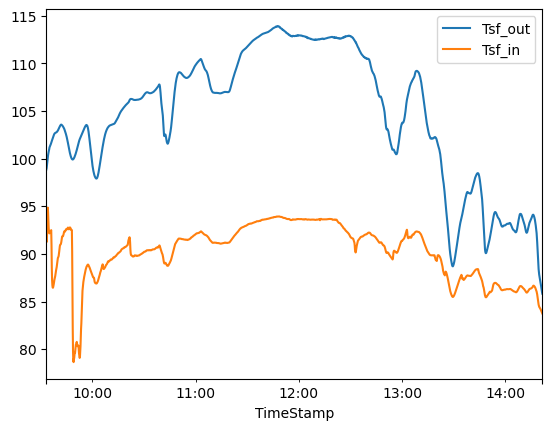

In [20]:
filter_str = '(df["Tsf_out"] - df["Tsf_in"] > 2.0) & (df["qsf"] > 1)'

df[ eval(filter_str) ].plot(
    y=["Tsf_out", "Tsf_in"],)


In [15]:
df["Tsf_in"].isna().cumsum()


TimeStamp
2023-10-30 07:30:00+00:00    0
2023-10-30 07:30:10+00:00    0
2023-10-30 07:30:20+00:00    0
2023-10-30 07:30:30+00:00    0
2023-10-30 07:30:40+00:00    0
                            ..
2023-10-30 17:29:20+00:00    0
2023-10-30 17:29:30+00:00    0
2023-10-30 17:29:40+00:00    0
2023-10-30 17:29:50+00:00    0
2023-10-30 17:30:00+00:00    0
Freq: 10s, Name: Tsf_in, Length: 3601, dtype: int64

In [3]:
# Load variables information
# with open( data_path / 'variables_config.hjson') as f:
#     vars_config = hjson.load(f)

# # Read data from csv, the index column is the one named "time", which is not the first one
# # df = pd.read_csv(data_path / filename_process_data, parse_dates=True, index_col='TimeStamp')
# df = pd.read_csv(data_path2 / filename_process_data, parse_dates=True, index_col='TimeStamp')

# # Rename index column to "time"
# df.index.names = ['time']
# # Set UTC timezone
# df = df.tz_localize('UTC')

# # Sample every `sample_rate` seconds to reduce the size of the dataframe
# df = df.resample(sample_rate).mean()

# # Rename columns from signal_id to var_id
# df = rename_signal_ids_to_var_ids(df, vars_config)

# display(df.head())

# # Convert units to model units
# df = unit_conversion(df, vars_config, input_unit_key='units_scada', output_unit_key='units_model')

# # Filter out nans until first value in Tts

# # start_idx = df.index.get_loc( df['Tts_c_b'].first_valid_index() )
# # df = df.iloc[start_idx:]
# df.dropna(inplace=True)
# logger.info(f'Removed up to row {start_idx} to filter NaN values in thermal storage state')

# If selecting only in operation
df_on = df.copy()
df_on = df_on.where(df["Tsf_out"] - df["Tsf_in"] > 1).dropna()

# Select time window
date = f"{df.index.year[0]}-{df.index.month[0]}-{df.index.day[0]}"
# df = df[f'{df.index.year[0]}-{df.index.month[0]}-{df.index.day[0]} 09:42:00':]
# df = df[f'{date} 10:10:40':f'{date} 14:18:00']


display(df.head())


,qmed_s,qts_dis_original,Tts_h_out,Tmed_s_in,Tts_c_in,ZT-AQU-TCV102,wmed_f,qmed_f,qmed_d,Tmed_c_out,...,Psf_l2,Psf_l3,Psf_l4,Psf_l5,Pth_ts_src,Pth_hx_s,Pth_ts_dis,sf_active,med_active,ts_active
time,,,,,,,,,,,,,,,,,,,,,
2023-06-30 07:30:00+00:00,0.0,0.032794,31.97233,43.10294,35.27598,99.96529,28.55168,0.0,0.0,20.76679,...,5.720328,3.909789,3.275995,3.556967,0.0,0.0,0.0,True,False,False
2023-06-30 07:30:10+00:00,0.0,0.032778,31.97203,43.08378,35.27570,99.97577,28.60588,0.0,0.0,20.76823,...,5.599809,3.767960,3.151961,3.360972,0.0,0.0,0.0,True,False,False
2023-06-30 07:30:20+00:00,0.0,0.032918,31.97476,43.07800,35.27361,99.97686,28.75967,0.0,0.0,20.69734,...,5.451842,3.639448,3.038847,3.166886,0.0,0.0,0.0,True,False,False
2023-06-30 07:30:30+00:00,0.0,0.032910,31.97271,43.10259,35.27358,99.97939,28.80362,0.0,0.0,20.69300,...,5.260044,3.481387,2.938891,3.005012,0.0,0.0,0.0,True,False,False
2023-06-30 07:30:40+00:00,0.0,0.032910,31.97300,43.11307,35.27736,99.96744,28.84802,0.0,0.0,20.74650,...,5.053210,3.289111,2.823497,2.887319,0.0,0.0,0.0,True,False,False


In [4]:
# Data visualization configuration

# plot_config = {
#     # General plot attributes
#     "title": "Solar field",
#     "subtitle": f"{df.index[0].strftime('%Y%m%d')} test visualization",
#     "height": 1400,
#     "width": 1000,
#     "margin": {"l": 20, "r": 20, "t": 100, "b": 20, "pad": 5},
#     "vertical_spacing": 0.03,
#     "xdomain": [0, 0.85],
#     # Individual plot attributes
#     # First specify the plot attributes
#     # In traces, specify the variables to be plotted, the definition order controls the order of the traces in the plot
#     "plots": {
#         "environment": {
#             "title": "Environment",
#             "row_height": 0.8,
#             "bg_color": "steelblue",
#             "ylabels_left": ["ºC"],
#             "ylabels_right": ["I (W/m<sup>2</sup>)"],  # As many as n_yaxis-1
#             "ylims_left": "manual",
#             "traces_left": [
#                 {
#                     "var_id": "Tamb",
#                     "mode": "lines",
#                     "color": "plotly_green",
#                     "axis_arrow": True,
#                     "arrow_yrel_pos": 0.9,
#                 },
#             ],
#             "traces_right": [
#                 {
#                     "var_id": "I",
#                     "mode": "lines",
#                     "color": "plotly_yellow",  # plotly green
#                     "axis_arrow": True,
#                     "arrow_yrel_pos": 0.1,
#                 },
#             ],
#         },
#         "temperatures": {
#             "title": "<b>Temperatures</b>",
#             "row_height": 1,
#             "bg_color": "bg_gray",  # bg gray
#             "ylabels_left": ["ºC"],
#             "ylims_left": "manual",
#             "traces_left": [
#                 {"var_id": "Tsf_in_l*", "dash": "longdash", "opacity": 0.3},
#                 {"var_id": "Tsf_out_l*", "opacity": 0.3},
#                 {
#                     "var_id": "Tsf_in",
#                     "color": "plotly_red",
#                     "width": 5,
#                     "dash": "dashdot",
#                 },
#                 {
#                     "var_id": "Tsf_out",
#                     "color": "plotly_red",
#                     "width": 5,
#                 },
#             ],
#         },
#         "flows": {
#             "title": "<b>Total flow</b> and per loop",
#             "row_height": 1,
#             "bg_color": "bg_gray",  # bg gray
#             "ylabels_left": ["m<sup>3</sup>/h"],
#             "ylims_left": "manual",
#             "traces_left": [
#                 {
#                     "var_id": "qsf_l*",
#                     "fill": "tonexty",
#                 },
#                 {
#                     "var_id": "qsf",
#                     "color": "plotly_yellow",
#                     "width": 5,
#                 },
#             ],
#         },
#         "power": {
#           "title": "<b>Thermal power generated</b> in total and per loop",
#           "row_height": 1,
#           "bg_color": "bg_gray", # bg gray
#           "ylabels_left": ["kW<sub>th</sub>"],
#           "ylabels_right": [""],
#           "ylims_left": "manual",
        
#           "traces_left": [
#             { "var_id": "Psf_l*", "fill": "tonexty", },
#             { "var_id": "Psf", "name": "P<sub>sf</sub>", "color": "plotly_yellow", "width": 5, },
#           ],
        
#         },
#     },
# }

# # Save to json
# import json
#
# with open( Path("../data") / 'plt_config_solar_field.json', 'w') as f:
#     json.dump(solar_field_viz_conf, f, indent=4)


In [5]:
# from iapws import IAPWS97 as w_props

# loop_ids: list[str] = [f"l{i}" for i in range(2, 5)]


# def calculate_power(row, max_power: float = 250, min_power=0):
#     # Solar field
#     w_p = w_props(P=0.16, T=(row["Tsf_in"] + row["Tsf_out"]) / 2 + 273.15)  # MPa, K
#     row["Psf"] = (
#         row["qsf"] / 3600 * w_p.rho * w_p.cp * (row["Tsf_out"] - row["Tsf_in"])
#     )  # kW
#     row["Psf"] = min(row["Psf"], max_power)
#     row["Psf"] = max(row["Psf"], min_power)

#     return row


# def calculate_power_loops(row, max_power: float = 250, min_power=0):
#     # Solar field loops
#     w_p = w_props(P=0.16, T=(row["Tsf_in"] + row["Tsf_out"]) / 2 + 273.15)  # MPa, K
#     for loop_str in loop_ids:
#         row[f"Psf_{loop_str}"] = (
#             row[f"qsf_{loop_str}"]
#             / 3600
#             * w_p.rho
#             * w_p.cp
#             * (row[f"Tsf_out_{loop_str}"] - row[f"Tsf_in_{loop_str}"])
#         )  # kW
#         row[f"Psf_{loop_str}"] = min(row[f"Psf_{loop_str}"], max_power)
#         row[f"Psf_{loop_str}"] = max(row[f"Psf_{loop_str}"], min_power)


# df = df.apply(calculate_power, axis=1)
# if all([f"qsf_{loop_str}" in df.columns for loop_str in loop_ids]):
#     df = df.apply(calculate_power_loops, axis=1)

# # How many nans?
# logger.debug(f'non value Psf: {df["Psf"].isna().sum()} / {len(df)}')


## Test visualization

In [24]:
# Visualize test

with open(data_path / "plt_config_solar_field.json") as f:
    plot_config = json.load(f)

fig = experimental_results_plot(
    plot_config, df, vars_config=vars_config, resample=resample_figures
)

fig.show(
    config=generate_plotly_config(
        fig, figure_name=f'solar_field_{df.index[0].strftime("%Y%m%d")}'
    )
)


In [7]:
# Save figure
# save_figure(
#     figure_name=f"sf_{df.index[0].strftime('%Y%m%d')}",
#     figure_path=src_path / 'docs/attachments',
#     fig=fig, formats=("svg", ),
#     width=fig.layout.width, height=fig.layout.height, scale=2
# )


## Solar field model (direct)

Given a flow rate as an input, calculate the outlet temperature of the solar field

In [8]:
# Once model is complete, copy to models_psa.solar_field

# Last synced with solarmed_modeling.solar_field:  20241005

import numpy as np


def calculate_total_pipe_length(
    q, n, sample_time=10, equivalent_pipe_area=7.85e-5
) -> float:
    """
    Calculate the total pipe length that a flow travels in a certain number of samples.
    Args:
        q: Array of flow rates from current samples up to a minimum of n past samples. The order should be from newer to older [m³/h]
        n: Number of samples
        sample_time: Time between samples [s]
        equivalent_pipe_area: Cross-sectional area representative of the pipe (simplification to not consider each different pipe section) [m²]

    Returns:
        l: Total pipe length [m]
    """
    q_avg = sum(q[:n]) / n
    l = q_avg * sample_time * n / equivalent_pipe_area
    return l


def find_delay_samples(
    q,
    sample_time=1,
    total_pipe_length: float = 5e7,
    equivalent_pipe_area: float = 7.85e-5,
    log=True,
) -> int:
    """
    Find the number of samples that a flow takes to travel a certain distance in a pipe.
    Args:
        q: Array of flow rates. If less samples than the delay are provided, then the delay will be under-estimated.
        IMPORTANT!The order should be from oldest (first element) to newest (last element) [m³/h]
        sample_time: Time between samples [s]
        total_pipe_length: Total representative length of the pipe (simplification to not consider each different pipe section) [m]
        equivalent_pipe_area: Cross-sectional area representative of the pipe (simplification to not consider each different pipe section) [m²] #NOTE: Probably the current value is way to small for the actual equivalent pipe area since it's just the cross section of the collector tubes, while the connecting pipes are quite large and with a much larger cross-section.

    Notes:
        - The `l` was manually fitted by:
            - 1. Manually setting the `n` value in the model until visually the delay was close to the actual delay
            - 2. Calculating the `l` for each sample using that `n` value with `calculate_total_pipe_length`
            - 3. Taking the average of the `l` values

    Returns:
        n_samples: Number of samples that the flow takes to travel the distance

        References:
            [1] J. E. Normey-Rico, C. Bordons, M. Berenguel, and E. F. Camacho, “A Robust Adaptive Dead-Time Compensator with Application to A Solar Collector Field1,” IFAC Proceedings Volumes, vol. 31, no. 19, pp. 93–98, Jul. 1998, doi: 10.1016/S1474-6670(17)41134-7.

            [2] G. Ampuño, L. Roca, M. Berenguel, J. D. Gil, M. Pérez, and J. E. Normey-Rico, “Modeling and simulation of a solar field based on flat-plate collectors,” Solar Energy, vol. 170, pp. 369–378, Aug. 2018, doi: 10.1016/j.solener.2018.05.076.


    Returns:
        n: Number of samples that the flow takes to travel the distance

    """
    sum_q = 0
    n_samples = 0
    n = len(q) - 1
    while sum_q < total_pipe_length and n >= 0:
        sum_q += q[n] * sample_time / equivalent_pipe_area
        n -= 1
        n_samples += 1

    if n < 0 and log:
        logger.warning(
            f"Flow rate array is not long enough to estimate delay, or the total pipe length is too big. Returning {n_samples} samples == len(q) == {n_samples * sample_time} s"
        )

    return n_samples


def solar_field_model(
    Tout_ant: float,
    Tin: float | np.ndarray,
    q: float | np.ndarray,
    I: float,
    Tamb: float,
    beta: float = 0.0975,
    gamma: float = 1.0,
    H: float = 2.2,
    sample_time=1,
    consider_transport_delay: bool = False,
    water_props: w_props = None,
    nt=1,
    npar=7 * 5,
    ns=2,
    Lt=1.15 * 20,
    Acs: float = 7.85e-5,
    log: bool = False,
) -> float:
    """

    Args:
        Tout_ant: Solar field outlet temperature at previous time step [ºC]
        Tin: Solar field inlet temperature [ºC]
        q: Solar field volumetric flow rate [m³/h]
        I: Solar direct irradiance [W/m²]
        Tamb: Ambient temperature [ºC]
        q_ant (optional): Solar field volumetric flow rate at previous time step [m³/h], for dynamic estimation of delay between q and Tout.
        beta: Irradiance model parameter [m]
        H: Thermal losses coefficient [J/sºC]
        nt: Number of tubes in parallel per collector
        np: Number of collectors in parallel per loop. Defaults to 7 packages * 5 compartments
        ns: Number of loops in series
        Lt: Solar field. Collector tube length [m]
        Acs (float, optional): Flat plate collector tube cross-section area [m²]. Defaults to 7.85e-5
        sample_time:

    Returns:
        Tout: (float): Solar field outlet temperature [ºC]

    """

    Tin = np.array(Tin)
    q = np.array(q)

    Leq = ns * Lt
    cf = npar * nt

    if Tout_ant > 120:
        # Above 110ºC, the model is not valid
        return 9999

    Tavg = (Tin.take(-1) + Tout_ant) / 2  # ºC
    if water_props is None:
        water_props = w_props(P=0.2, T=Tavg + 273.15)  # P=2 bar  -> 0.1MPa, T=Tin C,
    rho = water_props.rho  # [kg/m³]
    cp = water_props.cp * 1e3  # [kJ/kg·K] -> [J/kg·K]

    K1 = beta / (rho * cp * Acs)  # m / (kg/m3 * J/kg·K) = K·m²/J
    K2 = H / (Leq * Acs * rho * cp)  # J/sK / (m · m² · kg/m3 · J/kg·K) = 1/s
    K3 = (
        gamma / (Leq * Acs * cf) * (1 / 3600)
    )  # 1/(m · m² · -) * (1 / 3600s) = h/(3600·m³·s)

    # deltaTout_m = m [m3/h * kg/m3*1h/3600s] * deltaT [K] * K3 [1/(m * * m2 * kg/m3 * -)]

    if q.take(-1) == 0:
        # Just thermal losses
        deltaTout = -K2 * (Tavg - Tamb)

        """
            A more thorough approach would include radiation and convection losses:
            T = T - (H * (T - Tamb) + eta * (T⁴-T⁴)) * sample_time
        """

    else:
        if consider_transport_delay:
            n = find_delay_samples(q, sample_time=sample_time, log=log)
            # n = 500 / sample_time # Temporary value
        else:
            n = 1

        deltaTout = (
            K1 * I - K3 * q.take(-1) * (Tout_ant - Tin.take(-n)) - K2 * (Tavg - Tamb)
        )

        # If the model predicts a lower temperature than the inlet, return the inlet temperature
        # i.e. the solar field can't cool the fluid below the inlet temperature
        # if Tout_ant + deltaTout * sample_time <= Tin.take(-1):
        #     deltaTout = (Tin.take(-1) - Tout_ant) / sample_time
        #     logger.warning(f'Solar field cant cooldown below inlet temperature. New {deltaTout:.4f}ºC')

    out = Tout_ant + deltaTout * sample_time

    return out


NameError: name 'w_props' is not defined

### Model calibration

In [16]:
# Calibrate model

# TODO: Do not use idx_start for both initial index and span, separate in two variables `idx_start` and `span`

##%% Parameter fit
import numpy as np
from solarmed_modeling.solar_field import solar_field_model_calibration
from solarmed_modeling.calibration.parameters_fit import objective_function

# from solarMED_modeling.solar_field import solar_field_model
# from optimparallel import minimize_parallel
from scipy.optimize import minimize

Tin = "Tsf_in"
Tout = "Tsf_out"
qsf = "qsf"

df_cal = df[df["qsf"] > 4].copy()

idx_start = 70

# Parameters
# beta=2.5e-3 # Irradiance model parameter
# H=0.1 # Thermal losses coefficient (J/sºC)
# Lidia, te parece bien multiplicar por 4 para tener en cuenta todo el campo
# nt=1#*4 # Number of parallel tubes in each collector
# npar=7*5  # Number of parallel collectors in each loop
# ns=2  # Number of serial connections of collectors rows
# Lt=1.15*20 # Length of the collector inner tube [m]
# H = 5.19

# Inputs
# Case not considering transport delay
# q_sf = df['q_sf'][i].values
# Tsf_in = df.iloc[idx_start+1:][Tin].values
# q_sf = df.iloc[idx_start+1:][qsf].values
# Tamb = df.iloc[idx_start+1:]['Tamb'].values
# I = df.iloc[idx_start+1:]['I'].values

# Experimental (reference) outputs
# Tsf_out = df.iloc[idx_start:][Tout].values

# Case considering transport delay
Tamb = df_cal.iloc[idx_start + 1 :]["Tamb"].values
I = df_cal.iloc[idx_start + 1 :]["I"].values

Tsf_in = np.zeros((len(df_cal) - idx_start - 1, idx_start))
q_sf = np.zeros((len(df_cal) - idx_start - 1, idx_start))
for i in range(idx_start + 1, len(df_cal)):
    j = i - idx_start - 1
    Tsf_in[j] = df_cal.iloc[i - idx_start : i][
        "Tsf_in"
    ].values  # From current value, up to idx_start samples before
    q_sf[j] = df_cal.iloc[i - idx_start : i][
        "qsf"
    ].values  # From current value, up to idx_start samples before

# Experimental (reference) outputs
Tsf_out = df_cal.iloc[idx_start:][Tout].values

# Define optimizer inputs

# Case without considering delay (legacy)
inputs = [
    Tsf_out[0],
    Tsf_in,
    q_sf,
    I,
    Tamb,
]  # Input values
outputs = Tsf_out[1:]  # Actual output values
params = (sample_rate_numeric,)
# params = (H, sample_rate_numeric, )
# params = (nt, npar, ns, Lt)    # Constant model parameters

# Case considering transport delay
# inputs = [Tsf_out[idx_start], Tsf_in, q_sf, I, Tamb, ]  # Input values
# outputs = Tsf_out[idx_start+1:]  # Actual output values
# params = (sample_rate_numeric, True,) # (sample_time, consider_transport_delay)
params_objective_function = {
    "metric": "IAE",
    "recursive": True,
    "n_outputs": 1,
    "n_parameters": 3,
}  # 'len_outputs':[N, N]

# Set initial parameter values
# initial_parameters = [0.09, 3, 1]
initial_parameters = [1.152e-2, 0.5, 3.12]

#         beta min, beta max            Hmin,    Hmax
bounds = ((1e-6, 1),        (0.01, 1), (0, 50))  # To calibrate beta, h, and P3

# Perform parameter calibration
optimized_parameters = minimize(
    objective_function,
    initial_parameters,
    args=(solar_field_model_calibration, inputs, outputs, params, params_objective_function),
    bounds=bounds,
    method="Nelder-Mead",
).x

op = optimized_parameters

# Just beta and gamma
# beta  = op[0]
# gamma  = op[1]

# Just H
# H = op[0]

# All parameters at once
beta = op[0]
gamma = op[1]
H = op[2]


logger.info(f"beta: {beta:.2e}, H: {H:.2f}, gamma: {gamma:.2f}")


Iteration finished, error (IAE): 28064.95 for x=[0.012 0.500 3.120]
Iteration finished, error (IAE): 27829.82 for x=[0.012 0.500 3.120]
Iteration finished, error (IAE): 28115.85 for x=[0.012 0.525 3.120]
Iteration finished, error (IAE): 28181.28 for x=[0.012 0.500 3.276]
Iteration finished, error (IAE): 27834.48 for x=[0.012 0.517 2.964]
Iteration finished, error (IAE): 27686.94 for x=[0.012 0.486 3.016]
Iteration finished, error (IAE): 27447.62 for x=[0.012 0.467 2.964]
Iteration finished, error (IAE): 27349.60 for x=[0.013 0.489 2.912]
Iteration finished, error (IAE): 26981.25 for x=[0.013 0.483 2.808]
Iteration finished, error (IAE): 26955.57 for x=[0.013 0.450 2.964]
Iteration finished, error (IAE): 26416.34 for x=[0.014 0.417 2.964]
Iteration finished, error (IAE): 25936.72 for x=[0.015 0.411 2.704]
Iteration finished, error (IAE): 24815.41 for x=[0.016 0.367 2.496]
Iteration finished, error (IAE): 24696.43 for x=[0.017 0.378 2.548]
Iteration finished, error (IAE): 23556.82 for x=

2025-08-26 19:58:11.866 | INFO     | __main__:<module>:118 - beta: 1.80e-02, H: 0.00, gamma: 0.16


Iteration finished, error (IAE): 19459.14 for x=[0.018 0.158 0.000]


In [19]:
print(f"beta: {beta:.5e}, H: {H:.5e}, gamma: {gamma}")


beta: 1.80058e-02, H: 0.00000e+00, gamma: 0.15751912017063235


In [ ]:
# Pameters from 20240408 calibration run

beta = 4.36396e-02  # 2.91e-02
H = 13.676448551722462  # 9.73
gamma = 0.1


In [ ]:
# Either import the model from the module or use the one defined in a cell above
from solarmed_modeling.solar_field import solar_field_model, ModelParameters, FixedModelParameters


### Evaluate model

In [ ]:
# Visualize model validation
# beta=1.1578e-2
# H=3.1260
# gamma=0.0471

from iapws import IAPWS97 as w_props
from solarmed_modeling.solar_field import (solar_field_with_q_validation_model,
                                           solar_field_model,
                                           ModelParameters, 
                                           FixedModelParameters)

import math

model_params = ModelParameters(
    
)
fixed_model_params = FixedModelParameters()
fixed_model_params.Tmax = 120

span = math.ceil(600 / sample_rate_numeric) # 600 s
idx_start = np.max([span, 2]) # idx_start-1 should at least be one

# # Initialize result vectors
qsf_mod     = np.zeros(len(df), dtype=float)
Tsf_out_mod = np.zeros(len(df) - idx_start, dtype=float)
qsf_mod[0:idx_start] = df.iloc[0:idx_start]['qsf']
# Tsf_out_mod_delay = np.zeros(len(df) - idx_start, dtype=float)
# # l   = np.zeros(len(df), dtype=float)

# # Evaluate model
# # Tsf_out_mod[0:idx_start] = df.iloc[0:idx_start]['Tsf_out']
# # Tsf_out_mod_delay[0:idx_start] = df.iloc[0:idx_start]['Tsf_out']

# Tsf_out_mod[0] = df.iloc[idx_start]["Tsf_out"]
# Tsf_out_mod_delay[0] = df.iloc[idx_start]["Tsf_out"]
water_props: w_props = w_props(
    P=0.2, T=90 + 273.15
)  # P=2 bar  -> 0.2MPa, T in K, average working solar field temperature
start = time.time()
for i in range(idx_start + 1, len(df)):
#     # solar_field_model(Tin: conHotTemperatureType, q: PositiveFloat, I: PositiveFloat, Tamb: float,
#     #                   Tout_ant: float, q_ant: np.ndarray[float] = None,
#     #                   beta: float = 0.0975, H: float = 2.2, nt=1, np=7 * 5, ns=2, Lt=1.15 * 20, Acs:float= 7.85e-5,
#     #                   sample_time=1) -> float:
    ds = df.iloc[i]
    j = i - idx_start

    Tsf_out_mod[j], qsf_mod[i] = solar_field_with_q_validation_model(
        Tin=df.iloc[i - span : i][
            "Tsf_in"
        ].values,  # From current value, up to idx_start samples before
        q=ds["qsf"], # df.iloc[i-span:i]["qsf"].values, # 
        q_ant=qsf_mod[i-span:(i-1)],
        I=ds["I"],
        Tamb=ds["Tamb"],
        Tout_ant=Tsf_out_mod[j - 1],
        sample_time=sample_rate_numeric,
        consider_transport_delay=True,
        water_props=water_props,
        model_params=model_params,
        fixed_model_params=fixed_model_params,
        enforce_final_limits=False
    )

#     logger.info(
#         f"Iteration {i} / {len(df)}. Elapsed time: {time.time()-start_time:.5f} s"
#     )

#     # l[i] = calculate_total_pipe_length(q=df.iloc[i:i-idx_start:-1]['qsf'].values, n=60, sample_time=10, equivalent_pipe_area=7.85e-5)

logger.info(f"Evaluated {len(df)-idx_start} samples in {time.time()-start:.5f} s")
# # Calculate performance metrics
# Tsf_out_ref = df.iloc[idx_start:]["Tsf_out"].values
# iae = calculate_iae(Tsf_out_ref, Tsf_out_mod_delay)
# ise = calculate_ise(Tsf_out_ref, Tsf_out_mod_delay)
# itae = calculate_itae(Tsf_out_ref, Tsf_out_mod_delay)

# # df['Tsf_l2_pred'] = Tsf_out_mod

# # Estimate pipe length
# # l[l>1].mean() # 6e7

# # Visualize validation
# print(f"beta: {beta:.2e}, H: {H:.2f}, IAE: {iae:.2f}, ISE: {ise:.2f}, ITAE: {itae:.2f}")
df_mod = pd.DataFrame(
    {
        "Tsf_out": Tsf_out_mod,
        # "qsf": qsf_mod[idx_start:],
    },
    index=df.index[idx_start:]
)


2025-07-20 09:22:15.541 | INFO     | __main__:<module>:68 - Evaluated 3901 samples in 0.87980 s


In [29]:
# Save validation results
out_filename = f"out_exp_sf_{date_str}.csv"
df.to_csv(results_path / out_filename)
out_filename = f"out_mod_sf_{date_str}.csv"
df_mod.to_csv(results_path / out_filename)

logger.info(f"Results saved to {results_path / out_filename}")


2025-07-18 17:06:26.374 | INFO     | __main__:<module>:7 - Results saved to ../../results/models_validation/out_mod_sf_20230630.csv


In [10]:
# plot_config["subtitle"] = (
#     f"β: {beta:.4e}, H: {H:.4f}, ɣ: {gamma:.4f}, IAE: {iae:.2f}"
# )
fig = experimental_results_plot(
    plot_config,
    df,
    df_comp=[df_mod], #df_mod_delay],
    comp_trace_labels=[f"[Ts={sample_rate}]"],
    vars_config=vars_config,
    resample=resample_figures,
    title_text="<b>Solar field</b> model validation" # {df.index[0].strftime('%d/%m/%Y')}
 )
fig.show(config=generate_plotly_config(
    fig, figure_name=f'solar_field_{df.index[0].strftime("%Y%m%d")}'
))


In [30]:
# Save figure
save_figure(
    figure_name=f"solar_field_validation_{date_str}",
    figure_path=results_path,
    fig=fig, formats=('png', 'html'), 
    width=fig.layout.width, height=fig.layout.height, scale=2
)


2025-07-18 17:06:56.233 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_validation_20230630.png
2025-07-18 17:06:57.000 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_validation_20230630.html


### Evaluate model with different sample rates using util function `evaluate_model`

In [4]:
from solarmed_modeling.solar_field import ModelParameters, FixedModelParameters
from solarmed_modeling.solar_field.utils import evaluate_model

model_params = ModelParameters(
    # beta=beta,
    # gamma=gamma,
    # H=H,
)
fixed_model_params = FixedModelParameters()
fixed_model_params.Tmax = 120

alternatives_to_eval = ["standard", ] # "no-delay"
alternatives_to_eval_keys = ["delay", ] # "no-delay"
sample_rates: list[int] = [10, 400] # [5, 30, 60, 300, 600, 1000]
dfs = [df.copy().resample(f"{ts}s").mean() for ts in sample_rates] 

dfs_mod: list[pd.DataFrame] = []
stats: list[dict] = []
for df_, ts in zip(dfs, sample_rates):
    out = evaluate_model(df_, ts, model_params, 
                         fixed_model_params=fixed_model_params,
                         alternatives_to_eval=alternatives_to_eval, #, "constant-water-props"],
                         base_df=df)
    dfs_mod.extend(out[0])
    stats.extend(out[1])
    
# Only keep fast sample rate for no-delay model
if len(alternatives_to_eval)>1:
    dfs_mod.pop(-1)
    
# Match sample rates so they can be plot together
dfs_mod = [df_.reindex(df.index, method='ffill') for df_ in dfs_mod]

fig = experimental_results_plot(
    plot_config,
    df,
    df_comp=dfs_mod,
    comp_trace_labels=[f"[Ts={ts}s]" for ts in sample_rates] if len(alternatives_to_eval)==1 else ["[Ts=5s]", "[no-delay Ts=5s]", "[Ts=400s]"],
    # {df.index[0].strftime('%d/%m/%Y')}
    # ɣ: {model_params.gamma:.4f}
    title_text=f"<b>Solar field</b> model validation<br><span style='font-size: 13px;'>β: {model_params.beta:.4e} (m), H: {model_params.H:.4f} (W/m<sup>2</sup>) | T<sub>s</sub>={sample_rates}s</span>",
    vars_config=vars_config,
    resample=resample_figures,
)

fig.show(
    config=generate_plotly_config(
        fig, figure_name=f'solar_field_model_validation_{df.index[0].strftime("%Y%m%d")}'
    )
)


In [10]:
from phd_visualizations.regression import regression_plot

regression_plot(
    df_ref=df,
    df_mod=dfs_mod[1],
    var_ids=["Tsf_out"],
    units=["ºC"],
    show_error_metrics=["r2", "mae", "mape"],
    inline_error_metrics_text=True,
    legend_pos="side"
    
)


In [33]:
# Save figure
save_figure(
    figure_name=f"solar_field_validation_{date_str}",
    figure_path=results_path,
    fig=fig, formats=('png', 'html'), 
    width=fig.layout.width, height=fig.layout.height, scale=2
)


2025-08-26 20:25:47.581 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_validation_20231030.png
2025-08-26 20:25:47.876 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_validation_20231030.html


In [10]:
from solarmed_modeling.visualization.benchmark import visualize_benchmark

figs = visualize_benchmark(stats, title = f"<b>{date_str}. Benchmark results</b><br>For the solar field model</br>", output_unit="ºC", width=500)
[fig.show() for fig in figs]


[None, None, None, None, None]

### Evaluate and generate visualizations for model with different sample rates and for many dates

In [1]:
from pathlib import Path
from solarmed_modeling.solar_field import ModelParameters, FixedModelParameters
from solarmed_modeling.solar_field.benchmark import benchmark_model

data_path: Path = Path("../../data")
results_path: Path = Path("../../results/models_validation")

stats = benchmark_model(
    model_params = ModelParameters(),
    fixed_model_params = FixedModelParameters(),
    data_path=data_path,
    output_path=results_path,
    sample_rates=[5, 400],
    filter_non_active=False,
    alternatives_to_eval = ["constant-water-props"],
    save_results=True
)


Processing test 20231030 (1/11)


2025-08-29 15:32:55.077 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_validation_20231030.png
2025-08-29 15:32:55.654 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_validation_20231030.html
2025-08-29 15:32:57.039 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_5s_20231030.png
2025-08-29 15:32:57.080 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_5s_20231030.html
2025-08-29 15:32:58.351 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_400s_20231030.png
2025-08-29 15:32:58.393 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_400s_20231030.html


Processing test 20231106 (2/11)


2025-08-29 15:33:03.704 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_validation_20231106.png
2025-08-29 15:33:04.174 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_validation_20231106.html
2025-08-29 15:33:05.521 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_5s_20231106.png
2025-08-29 15:33:05.567 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_5s_20231106.html
2025-08-29 15:33:06.843 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_400s_20231106.png
2025-08-29 15:33:06.885 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_400s_20231106.html


Processing test 20230630 (3/11)


2025-08-29 15:33:15.860 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_validation_20230630.png
2025-08-29 15:33:17.291 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_validation_20230630.html
2025-08-29 15:33:18.660 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_5s_20230630.png
2025-08-29 15:33:18.702 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_5s_20230630.html
2025-08-29 15:33:20.089 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_400s_20230630.png
2025-08-29 15:33:20.122 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_400s_20230630.html


Processing test 20230703 (4/11)


2025-08-29 15:33:28.780 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_validation_20230703.png
2025-08-29 15:33:30.495 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_validation_20230703.html
2025-08-29 15:33:31.880 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_5s_20230703.png
2025-08-29 15:33:31.920 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_5s_20230703.html
2025-08-29 15:33:33.363 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_400s_20230703.png
2025-08-29 15:33:33.401 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_400s_20230703.html


Processing test 20230508 (5/11)


2025-08-29 15:33:41.413 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_validation_20230508.png
2025-08-29 15:33:42.930 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_validation_20230508.html
2025-08-29 15:33:44.216 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_5s_20230508.png
2025-08-29 15:33:44.256 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_5s_20230508.html
2025-08-29 15:33:45.522 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_400s_20230508.png
2025-08-29 15:33:45.554 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_400s_20230508.html


Processing test 20230707_20230710 (6/11)
Failed to evaluate 20230707_20230710: Variable I not found in dataframe columns: Index(['qmed_s', 'qts_dis', 'SC-AQU-P102', 'Tts_h_out', 'Tts_c_in',
       'ZT-AQU-TCV102', 'Tamb', 'qts_src_original', 'qsf', 'Tts_c_t',
       'Tts_c_m', 'Tts_c_b', 'Tts_h_t', 'Tts_h_m', 'Tts_h_b', 'Tts_c_b_out',
       'Tts_h_in', 'Tsf_in', 'Tsf_out', 'UK-SF-P001-fq', 'UK-SF-P002a-fq',
       'Tts_src_in', 'Tts_dis', 'Tts_dis_in', 'Thx_p_in', 'Thx_p_out',
       'Thx_s_in', 'Thx_s_out', 'qhx_p', 'qhx_s_original', 'T3wv_src',
       'T3wv_dis_out', 'q3wv_src', 'q3wv_dis', 'qhx_s', 'qts_src', 'Jtotal',
       'Pth_sf', 'Pth_hx_p', 'Pth_ts_src', 'Pth_hx_s', 'Pth_ts_dis',
       'sf_active'],
      dtype='object')
Processing test 20230628 (7/11)


2025-08-29 15:33:55.273 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_validation_20230628.png
2025-08-29 15:33:56.789 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_validation_20230628.html
2025-08-29 15:33:58.173 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_5s_20230628.png
2025-08-29 15:33:58.204 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_5s_20230628.html
2025-08-29 15:33:59.568 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_400s_20230628.png
2025-08-29 15:33:59.602 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_400s_20230628.html


Processing test 20230511 (8/11)


2025-08-29 15:34:06.872 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_validation_20230511.png
2025-08-29 15:34:08.302 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_validation_20230511.html
2025-08-29 15:34:09.680 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_5s_20230511.png
2025-08-29 15:34:09.708 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_5s_20230511.html
2025-08-29 15:34:10.957 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_400s_20230511.png
2025-08-29 15:34:10.987 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_400s_20230511.html


Processing test 20230629 (9/11)


2025-08-29 15:34:19.338 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_validation_20230629.png
2025-08-29 15:34:20.825 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_validation_20230629.html
2025-08-29 15:34:22.263 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_5s_20230629.png
2025-08-29 15:34:22.292 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_5s_20230629.html
2025-08-29 15:34:23.652 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_400s_20230629.png
2025-08-29 15:34:23.681 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_400s_20230629.html


Processing test 20230505 (10/11)


2025-08-29 15:34:31.286 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_validation_20230505.png
2025-08-29 15:34:32.677 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_validation_20230505.html
2025-08-29 15:34:33.982 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_5s_20230505.png
2025-08-29 15:34:34.011 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_5s_20230505.html
2025-08-29 15:34:35.268 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_400s_20230505.png
2025-08-29 15:34:35.299 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_400s_20230505.html


Processing test 20231031 (11/11)


2025-08-29 15:34:40.531 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_validation_20231031.png
2025-08-29 15:34:41.014 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_validation_20231031.html
2025-08-29 15:34:42.590 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_5s_20231031.png
2025-08-29 15:34:42.621 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_5s_20231031.html
2025-08-29 15:34:43.892 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_400s_20231031.png
2025-08-29 15:34:43.922 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/solar_field_regression_400s_20231031.html


In [20]:
def update_plot_config(plot_config: dict, objective:str, show_titles: bool = False, show_axis_titles: bool = False, showlegends: bool = False) -> dict:
    pc = plot_config.copy()
    
    pc["title"] = f"<b>Solar field</b> model {objective}"
    pc["subtitle"] = ""
    for plot in pc["plots"].values():
        if not show_titles:
            plot["title"] = ""
        if not show_axis_titles:
            plot["ylabels_left"] = ["" for _ in plot["ylabels_left"]]
            if "ylabels_right" in plot:
                plot["ylabels_right"] = ["" for _ in plot["ylabels_right"]]
        if not showlegends:
            plot["showlegend"] = False
            for trace in plot.get("traces_left", []):
                trace["showlegend"] = False
            for trace in plot.get("traces_right", []):
                trace["showlegend"] = False
    return pc

objective: str = "calibration"
show_titles = False
show_axis_titles = False
showlegends = False

fig = experimental_results_plot(
    update_plot_config(plot_config, objective, show_titles, show_axis_titles, showlegends),
    df,
    df_comp=dfs_mod,
    comp_trace_labels=[f"[Ts={ts}s]" for ts in sample_rates] if len(alternatives_to_eval)==1 else ["[Ts=5s]", "[no-delay Ts=5s]", "[Ts=400s]"],
    # {df.index[0].strftime('%d/%m/%Y')}
    # ɣ: {model_params.gamma:.4f}
    # title_text=f"<b>Solar field</b> model validation<br><span style='font-size: 13px;'>β: {model_params.beta:.4e} (m), H: {model_params.H:.4f} (W/m<sup>2</sup>) | T<sub>s</sub>={sample_rates}s</span>",
    vars_config=vars_config,
    resample=resample_figures,
)

fig.show(
    config=generate_plotly_config(
        fig, figure_name=f'solar_field_model_validation_{df.index[0].strftime("%Y%m%d")}'
    )
)



In [ ]:
from phd_visualizations.utils import stack_images_horizontally, update_plot_config
import pandas as pd
from pathlib import Path
import json
import copy

data_path = Path("../../data")
results_path = Path("../../results/models_validation")
date_strs: tuple[str, str] = ("20231106", "20230511")
sample_rates = [5, 400]

plot_config = json.load(open(data_path / "plt_config_solar_field.json"))

for idx in range(2):
    
    if idx == 0:
        show_titles = True
        showlegends=False
        show_left_axis_titles = True
        show_right_axis_titles = False
        width = 800
        title_text=f"<b>Solar field</b> model calibration<br><span style='font-size: 14px;'>β: {model_params.beta:.4e} (m), H: {model_params.H:.4f} (W/m<sup>2</sup>) | T<sub>s</sub>={sample_rates}s</span>"
    else:
        show_titles = False
        showlegends=True
        show_left_axis_titles = False
        show_right_axis_titles = True
        width = 700
        title_text="<b>Solar field</b> model validation"
        
    df = pd.read_csv(results_path / f"out_exp_solar_field_{date_strs[idx]}.csv", index_col=0, parse_dates=True)
    dfs_mod = [pd.read_csv(results_path / f"out_mod_solar_field_{ts}s_{date_strs[idx]}.csv", index_col=0, parse_dates=True) for ts in sample_rates]

    fig = experimental_results_plot(
        update_plot_config(plot_config, show_titles, show_left_axis_titles, show_right_axis_titles, showlegends, width),
        df,
        df_comp=dfs_mod,
        comp_trace_labels=[f"[Ts={ts}s]" for ts in sample_rates],
        # {df.index[0].strftime('%d/%m/%Y')}
        # ɣ: {model_params.gamma:.4f}
        title_text=title_text,
        vars_config=vars_config,
        resample=False,
    )

    save_figure(
        fig, 
        figure_name=f"fig{idx+1}",
        figure_path=results_path,
        formats=["png"],
    )

stack_images_horizontally(
    [results_path / f"fig{idx+1}.png" for idx in range(2)],
    output_path=results_path / "solar_field_validation.png",
)


2025-08-27 19:34:01.541 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/fig1.png
2025-08-27 19:34:11.142 | INFO     | phd_visualizations:save_figure:41 - Figure saved in ../../results/models_validation/fig2.png


## Inverse solar field model

Given an outlet temperature, obtain the required flow rate to achieve it

In [32]:
import math
from typing import Literal
import time
import numpy as np
import pandas as pd
from loguru import logger
from iapws import IAPWS97 as w_props
from solarmed_modeling.metrics import calculate_metrics
from solarmed_modeling.utils import resample_results

from solarmed_modeling.solar_field import (supported_eval_alternatives, 
                                           ModelParameters, 
                                           FixedModelParameters,
                                           solar_field_inverse_model2 as model)

def evaluate_model(
    df: pd.DataFrame, sample_rate: int, 
    model_params: ModelParameters, fixed_model_params: FixedModelParameters = FixedModelParameters(),
    alternatives_to_eval: list[Literal["standard", "constant-water-props"]] = supported_eval_alternatives,
    log_iteration: bool = False, base_df: pd.DataFrame = None,
) -> tuple[list[pd.DataFrame], list[dict[str, str | dict[str, float]]]]:
    
    """
    Evaluate the solar field model using different alternatives and calculate performance metrics.

    Args:
        df: DataFrame containing the input data for the model.
        sample_rate: Sampling rate in seconds.
        model_params: ModelParameters object containing the model parameters.
        alternatives_to_eval: List of alternatives to evaluate. Supported alternatives are "standard", "no-delay", and "constant-water-props".
        log_iteration: Boolean flag to log each iteration.
        base_df: Dataframe with a base sample rate. If provided, the model outputs will be resampled to its sample rate 
        and used to calculate the metrics. Optional

    Raises:
        ValueError: If an unsupported alternative is provided in alternatives_to_eval.

    Returns:
        tuple: A tuple containing a list of DataFrames with the model outputs and a list of dictionaries with the performance metrics.
    """
    
    assert all([alt in supported_eval_alternatives for alt in alternatives_to_eval])
    out_var_id: str = "qsf"

    span = math.ceil(600 / sample_rate) # 600 s
    idx_start = np.max([span, 2]) # idx_start-1 should at least be one 

    # Experimental (reference) outputs, used lated in performance metrics evaluation
    if base_df is None:
        idx_start_ref = idx_start
        ref_df = df
    else:
        if base_df.index.freq.n > df.index.freq.n:
            raise ValueError(f"Base dataframe can't have a lower sample rate than the input dataframe: base df rate ({base_df.index.freq.n}) < evaluting df rate ({df.index.freq.n})")
        
        idx_start_ref = int(round(600 / base_df.index.freq.n, 0))
        ref_df = base_df
    out_ref = ref_df.iloc[idx_start_ref:][out_var_id].values

    # Initialize particular variables for earch alternative that requires it
    water_props = None
    if "constant-water-props" in alternatives_to_eval:
        water_props: w_props = w_props(
            P=0.2, T=90 + 273.15
        )  # P=2 bar  -> 0.2MPa, T in K, average working solar field temperature
        
    # if "no-delay" in alternatives_to_eval:
    #     logger.warning("The 'no-delay' alternative has hardcoded parameters. Make sure to adjust them if needed.")

    # Initialize result vectors
    outs_mod: list[np.ndarray[float]] = [np.zeros(len(df) - idx_start, dtype=float) for _ in alternatives_to_eval]
    stats = []

    for alt_idx, alt_id in enumerate(alternatives_to_eval):
        out = outs_mod[alt_idx]
        out[0] = df.iloc[idx_start][out_var_id]
        # out_ant = df.iloc[:idx_start+1][out_var_id].values
        out_ant = np.ones((span, ), dtype=float) * 6
        
        logger.info(f"Starting evaluation of alternative {alt_id}. Sample rate = {sample_rate} s")
        # Evaluate model
        start_time_alt = time.time()
        for i in range(idx_start + 1, len(df)):
            # print(f"{out_ant=}")
            ds = df.iloc[i]
            j = i - idx_start
            start_time = time.time()
            
            # if alt_id == "no-delay":
            #     out[j] = model(
            #         Tin=ds["Tsf_in"],
            #         q=ds["qsf"],
            #         I=ds["I"],
            #         Tamb=ds["Tamb"],
            #         Tout_ant=out[j - 1],
            #         sample_time=sample_rate,
            #         consider_transport_delay=False,
            #         beta=1.1578e-2,
            #         H=3.1260,
            #         gamma=0.0471,
            #     )
            # if alt_id == "standard":
            #     out[j] = model(
            #         Tout=ds["Tsf_out"],
            #         Tout_ant=df.iloc[i-1]["Tsf_out"],
            #         q_ant=out_ant, # From current value, up to idx_start samples before
            #         Tin=df.iloc[i - span : i][
            #             "Tsf_in"
            #         ].values,  # From current value, up to idx_start samples before
            #         I=ds["I"],
            #         Tamb=ds["Tamb"],
            #         sample_time=sample_rate,
            #         consider_transport_delay=True,
            #         water_props=None,
            #         model_params=model_params,
            #         fixed_model_params=fixed_model_params
            #     )
            if alt_id == "constant-water-props":
                out[j] = model(
                    Tout=ds["Tsf_out"],
                    Tout_ant=df.iloc[i-1]["Tsf_out"],
                    q_ant=out_ant,
                    # q_ant=df.iloc[i - span : i][
                    #     "qsf"
                    # ].values, # From current value, up to idx_start samples before
                    Tin=df.iloc[i - span : i][
                        "Tsf_in"
                    ].values,  # From current value, up to idx_start samples before
                    I=ds["I"],
                    Tamb=ds["Tamb"],
                    sample_time=sample_rate,
                    consider_transport_delay=True,
                    water_props=water_props,
                    model_params=model_params,
                    fixed_model_params=fixed_model_params
                )
            else:
                raise ValueError(
                    f"Unsupported alternative {alt_id}, options are: {supported_eval_alternatives}"
                )

            # Shift and add last output to previous outputs array
            out_ant = np.roll(out_ant, -1)
            out_ant[-1] = out[j]
            
            elapsed_time = time.time() - start_time
            if log_iteration:
                logger.info(
                    f"[{alt_id}] Iteration {i} / {len(df)}. Elapsed time: {elapsed_time:.5f} s. Error: {abs(out[j]-out_ref[j]):.2f}"
                )
            # End of iteration evaluation
                
        # End of alternative evaluation
        elapsed_time = time.time() - start_time_alt
        
        if base_df is None:
            out_metrics = out
        else:
            # Resample out to base_df sample rate using ffill
            out_metrics = resample_results(out, new_index=base_df.index[idx_start_ref:], 
                                           current_index=df.index[idx_start:], reshape=True)
        
        # Calculate performance metrics
        stats.append({
            "test_id": df.index[0].strftime("%Y%m%d"),
            "alternative": alt_id,
            "metrics": calculate_metrics(out_metrics, out_ref), 
            "elapsed_time": elapsed_time,
            "average_elapsed_time": elapsed_time / (len(df) - idx_start),
            "model_parameters": model_params.__dict__,
            "sample_rate": sample_rate
        })
        
        logger.info(f"Finished evaluation of alternative {alt_id}. Elapsed time: {elapsed_time:.1f} s, MAE: {stats[-1]['metrics']['MAE']:.2f} m³/h")

        dfs: list[pd.DataFrame] = [
            pd.DataFrame(out, columns=[out_var_id], index=df.index[idx_start:])
            for out in outs_mod
        ]

    return dfs, stats

model_params = ModelParameters()
fixed_model_params = FixedModelParameters()

df_on = df.copy()
df_on = df_on.where(df["Tsf_out"] - df["Tsf_in"] > 5).dropna()


sample_rates: list[int] = [60, 300, 600, 1000]
dfs = [df_on.copy().resample(f"{ts}s").mean() for ts in sample_rates] 

dfs_mod: list[pd.DataFrame] = []
stats: list[dict] = []
for df_, ts in zip(dfs, sample_rates):
    out = evaluate_model(df_, ts, 
                         model_params=model_params,
                         fixed_model_params=fixed_model_params,
                         alternatives_to_eval=["constant-water-props"],
                         base_df=df)
    dfs_mod.extend(out[0])
    stats.extend(out[1])
    
# Match sample rates so they can be plot together
dfs_mod = [df_.reindex(df_on.index, method='ffill') for df_ in dfs_mod]

plot_config["title"] = (
    f"<b>Solar field inverse</b> model validation {df.index[0].strftime('%d/%m/%Y')}"
)
plot_config["subtitle"] = (
    f"β: {model_params.beta:.4e}, H: {model_params.H:.4f}, ɣ: {model_params.gamma:.4f}, Ts={sample_rates}s"
)

fig = experimental_results_plot(
    plot_config,
    df_on,
    df_comp=dfs_mod,
    vars_config=vars_config,
    resample=resample_figures,
)

fig.show(
    config=generate_plotly_config(
        fig, figure_name=f'solar_field_model_validation_{df.index[0].strftime("%Y%m%d")}'
    )
)



2025-01-10 10:33:50.392 | INFO     | __main__:evaluate_model:80 - Starting evaluation of alternative constant-water-props. Sample rate = 60 s
/workspaces/solarMED-modeling/src/solarmed_modeling/solar_field/__init__.py:170: RuntimeWarning:

The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.

/tmp/ipykernel_850186/541255366.py:119: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

2025-01-10 10:33:51.021 | INFO     | __main__:evaluate_model:174 - Finished evaluation of alternative constant-water-props. Elapsed time: 0.1 s, MAE: 0.83 m³/h
2025-01-10 10:33:51.024 | INFO     | __main__:evaluate_model:80 - Starting evaluation of alternative constant-water-props. Sample rate = 300 s
2025-01-10 10:33:51.499 | INFO     | __main__:evaluate_model:174 - Finished evaluation

# Deprecated section


In [ ]:
df_on = df.where(df["Tsf_out"] - df["Tsf_in"] > 2).dropna()

from scipy import signal

# Apply a filter to the `I` signal
b, a = signal.butter(3, 0.05)

df_on["I_filtered"] = signal.filtfilt(b, a, df_on["I"])

df_on[["I", "I_filtered"]].plot()


In [8]:
# Once model is complete, copy to models_psa.solar_field
import numpy
from scipy import signal
from scipy.optimize import fsolve


# b, a = signal.butter(1, 0.1)
# zi = signal.lfilter_zi(b, a)


def solar_field_inverse_model2(
    Tout_ant: float,
    Tin: float | np.ndarray,
    Tout: float,
    I: float,
    Tamb: float,
    beta: float = 0.0975,
    gamma: float = 1.0,
    H: float = 2.2,
    sample_time=1,
    q_ant: np.ndarray[float] = None,
    nt=1,
    npar=7 * 5,
    ns=2,
    Lt=1.15 * 20,
    Acs: float = 7.85e-5,
) -> float:
    """
    Solar field inverse model. New approach using fsolve to solve `solar_field_model`.

    Args:
        Tout_ant: Solar field outlet temperature at previous time step [ºC]
        Tin: Solar field inlet temperature [ºC]
        q: Solar field volumetric flow rate [m³/h]
        I: Solar direct irradiance [W/m²]
        Tamb: Ambient temperature [ºC]
        q_ant (optional): Solar field volumetric flow rate at previous time step [m³/h], for dynamic estimation of delay between q and Tout. Not yet implemented.
        beta: Irradiance model parameter [m]
        H: Thermal losses coefficient [J/sºC]
        nt: Number of tubes in parallel per collector
        npar: Number of collectors in parallel per loop. Defaults to 7 packages * 5 compartments
        ns: Number of loops in series
        Lt: Solar field. Collector tube length [m
        Acs (float, optional): Flat plate collector tube cross-section area [m²]. Defaults to 7.85e-5
        sample_time:

    Returns:
        Tout: (float): Solar field outlet temperature [ºC]

    """

    qmin = 5
    qmax = 10  # TODO: Check

    # If there is no temperature difference, the flow rate cannot be estimated, it could be any
    if Tout - Tin.take(-1) < 0.5:
        return 0

    wrapped_model = (
        lambda q: solar_field_model(
            Tout_ant=Tout_ant,
            Tin=Tin,
            q=q,
            I=I,
            Tamb=Tamb,
            beta=beta,
            gamma=gamma,
            H=H,
            sample_time=sample_time,
            consider_transport_delay=True,
            nt=nt,
            npar=npar,
            ns=ns,
            Lt=Lt,
            Acs=Acs,
        )
        - Tout
    )

    # Solve for q
    initial_guess = q_ant.take(-1)
    q = fsolve(wrapped_model, initial_guess)

    return q


def solar_field_inverse_model(
    Tout_ant: float,
    Tin: float | np.ndarray,
    Tout: float,
    I: float,
    Tamb: float,
    beta: float = 0.0975,
    gamma: float = 1.0,
    H: float = 2.2,
    sample_time=1,
    consider_transport_delay: bool = False,
    filter_signal: bool = True,
    q_ant: np.ndarray[float] = None,
    nt=1,
    npar=7 * 5,
    ns=2,
    Lt=1.15 * 20,
    Acs: float = 7.85e-5,
    f=0.8,
) -> float:
    """

    Args:
        Tout_ant: Solar field outlet temperature at previous time step [ºC]
        Tin: Solar field inlet temperature [ºC]
        q: Solar field volumetric flow rate [m³/h]
        I: Solar direct irradiance [W/m²]
        Tamb: Ambient temperature [ºC]
        q_ant (optional): Solar field volumetric flow rate at previous time step [m³/h], for dynamic estimation of delay between q and Tout. Not yet implemented.
        beta: Irradiance model parameter [m]
        H: Thermal losses coefficient [J/sºC]
        nt: Number of tubes in parallel per collector
        npar: Number of collectors in parallel per loop. Defaults to 7 packages * 5 compartments
        ns: Number of loops in series
        Lt: Solar field. Collector tube length [m
        Acs (float, optional): Flat plate collector tube cross-section area [m²]. Defaults to 7.85e-5
        sample_time:

    Returns:
        Tout: (float): Solar field outlet temperature [ºC]

    """

    qmin = 5
    qmax = 10  # TODO: Check

    Leq = ns * Lt
    cf = npar * nt

    Tavg = (Tin.take(-1) + Tout) / 2  # ºC

    w_props_avg = w_props(P=0.16, T=Tavg + 273.15)  # P=1 bar  -> 0.1MPa, T=Tin C,
    rho = w_props_avg.rho  # [kg/m³]
    cp = w_props_avg.cp * 1e3  # [kJ/kg·K] -> [J/kg·K]

    K1 = beta / (rho * cp * Acs)  # m / (kg/m3 * J/kg·K) = K·m²/J
    K2 = H / (Leq * Acs * rho * cp)  # J/sK / (m · m² · kg/m3 · J/kg·K) = 1/s
    K3 = (
        gamma / (Leq * Acs * cf) * (1 / 3600)
    )  # 1/(m · m² · -) * (1 / 3600s) = h/(3600·m³·s)

    # If there is no temperature difference, the flow rate cannot be estimated
    if Tout - Tin.take(-1) < 0.5:
        return 0

    if consider_transport_delay:
        n = find_delay_samples(q_ant, sample_time=sample_time)
        # n = 500 / sample_time # Temporary value
    else:
        n = 1

    q = (
        1
        / (K3 * (Tout - Tin.take(-n)))
        * (((Tout_ant - Tout) / sample_time) + (I * K1) + ((Tamb - Tavg) * K2))
    )

    q = float(q)  # Chapuza

    # try:
    q = numpy.max([q, qmin])
    q = numpy.min([q, qmax])
    # except Exception as e:
    #     logger.error(f'Error: {e}, q: {q}, qmin: {qmin}, qmax: {qmax}, deltaT: {deltaT}, Tout_ant: {Tout_ant}, Tout: {Tout}, I: {I}, Tin: {Tin}, Tamb: {Tamb}')
    #     q = qmin

    if q_ant is not None and filter_signal:
        # q = signal.filtfilt(b, a, numpy.append(q_ant, q))[-1]
        # q, _ = signal.lfilter(b, a, numpy.append(q_ant, q), zi=zi*q_ant[0])
        # q = q.take(-1)
        # Weighted average of the last n samples
        q = f * q + (1 - f) * q_ant[-n:].mean()

    return q


In [ ]:
# Calibrate model
# En teoría los parámetros del modelo directo deberían de haber servido para esto y no hacer falta recalibrar
# TODO: Needs to be refactor to accept arrays as solar_field_model

##%% Parameter fit
import numpy as np
from solarMED_modeling.calibration.parameters_fit import objective_function

# from solarMED_modeling.solar_field import solar_field_model
# from optimparallel import minimize_parallel
from scipy.optimize import minimize

idx_start = 70
span = 62

if span > idx_start:
    logger.warning(
        f"¿Qué te has tomado hoy? Span {span} cant be greater than idx_start {idx_start}. Setting span to idx_start"
    )
    span = idx_start

Tin = "Tsf_in"
Tout = "Tsf_out"
qsf = "qsf"

# Parameters
# beta=2.5e-3 # Irradiance model parameter
# H=0.1 # Thermal losses coefficient (J/sºC)
# Lidia, te parece bien multiplicar por 4 para tener en cuenta todo el campo
# nt=1#*4 # Number of parallel tubes in each collector
# npar=7*5  # Number of parallel collectors in each loop
# ns=2  # Number of serial connections of collectors rows
# Lt=1.15*20 # Length of the collector inner tube [m]
# H = 5.19

# Inputs
# q_sf = df['q_sf'][i].values
Tsf_in = df.iloc[1:][Tin].values
Tsf_out = df[Tout].values
Tamb = df.iloc[1:]["Tamb"].values
I = df.iloc[1:]["I"].values

# Experimental (reference) outputs
q_sf = df.iloc[1:][qsf].values

# Define optimizer inputs
inputs = [
    Tsf_out[:-1],
    Tsf_in,
    Tsf_out[1::],
    I,
    Tamb,
]  # Input values
outputs = q_sf  # Actual output values
params = (sample_rate_numeric,)
# params = (H, sample_rate_numeric, )
# params = (nt, npar, ns, Lt)    # Constant model parameters
params_objective_function = {
    "metric": "IAE",
    "recursive": False,
    "n_outputs": 1,
    "n_parameters": 3,
}  # 'len_outputs':[N, N]

# Set initial parameter values
# initial_parameters = [0.09, 3, 1]
initial_parameters = [1.82e-2, 0.07, 5]

#         beta min, beta max    Hmin,    Hmax
bounds = ((1e-6, 1), (0.01, 2), (0, 50))  # To calibrate beta, h, and P3
# bounds = ((0, 50)) # To calibrate only H
# bounds = ((1e-6, 1), (0.01, 2)) # To calibrate beta and P3

# Perform parameter calibration
optimized_parameters = minimize(
    objective_function,
    initial_parameters,
    args=(
        solar_field_inverse_model,
        inputs,
        outputs,
        params,
        params_objective_function,
    ),
    bounds=bounds,
    method="Nelder-Mead",
).x

op = optimized_parameters

# Just beta and gamma
# beta  = op[0]
# gamma  = op[1]

# Just H
# H = op[0]

# All parameters at once
beta = op[0]
gamma = op[1]
H = op[2]

logger.info(f"beta: {beta:.2e}, H: {H:.2f}, gamma: {gamma:.2f}")


In [ ]:
df_on.iloc[70]["qsf"]


In [ ]:
# Visualize model validation
# from solarMED_modeling.solar_field import solar_field_model
from solarMED_modeling.calibration.parameters_fit import (
    calculate_iae,
    calculate_ise,
    calculate_itae,
)

idx_start = int(round(700 / sample_rate_numeric, 0))  # 600 s
span = int(round(700 / sample_rate_numeric, 0))

if span > idx_start:
    logger.warning(
        f"Span {span} cant be greater than idx_start {idx_start}. Setting span to idx_start"
    )
    span = idx_start

# Initialize result vectors
# q_sf_mod   = np.zeros(len(df), dtype=float)
qsf_mod = np.zeros(len(df_on) - idx_start + span, dtype=float)
qsf_mod_delay = np.zeros(len(df_on) - idx_start + span, dtype=float)
qsf_fsolve = np.zeros(len(df_on) - idx_start + span, dtype=float)
qsf_mod_delay_filter = np.zeros(len(df_on) - idx_start + span, dtype=float)
# l   = np.zeros(len(df), dtype=float)

# Evaluate model
qsf_mod[0:span] = df_on.iloc[idx_start - span : idx_start]["qsf"]
qsf_mod_delay[0:span] = df_on.iloc[idx_start - span : idx_start]["qsf"]
qsf_fsolve[0:span] = df_on.iloc[idx_start - span : idx_start]["qsf"]
qsf_mod_delay_filter[0:span] = df_on.iloc[idx_start - span : idx_start]["qsf"]

# qsf_mod[0:idx_start] = df_on.iloc[0:idx_start]['qsf']
for i in range(idx_start, len(df_on)):
    # solar_field_model(Tin: conHotTemperatureType, q: PositiveFloat, I: PositiveFloat, Tamb: float,
    #                   Tout_ant: float, q_ant: np.ndarray[float] = None,
    #                   beta: float = 0.0975, H: float = 2.2, nt=1, np=7 * 5, ns=2, Lt=1.15 * 20, Acs:float= 7.85e-5,
    #                   sample_time=1) -> float:
    ds = df_on.iloc[i]
    j = i - (idx_start - span)

    qsf_mod[j] = solar_field_inverse_model(
        Tin=ds["Tsf_in"],
        Tout=ds["Tsf_out"],
        I=ds["I_filtered"],
        Tamb=ds["Tamb"],
        Tout_ant=df_on.iloc[i - 1]["Tsf_out"],
        sample_time=sample_rate_numeric,
        consider_transport_delay=False,
        # Model parameters
        beta=2e-2,
        H=2,
        gamma=0.0471,
        # beta=beta, H=H, gamma=gamma
    )

    qsf_mod_delay[j] = solar_field_inverse_model(
        Tin=df_on.iloc[i - span : i]["Tsf_in"].values,
        Tout=ds["Tsf_out"],
        I=ds["I"],
        Tamb=ds["Tamb"],
        Tout_ant=df_on.iloc[i - 1]["Tsf_out"],
        q_ant=qsf_mod_delay[j : j - span : -1],
        sample_time=sample_rate_numeric,
        consider_transport_delay=True,
        filter_signal=False,
        # Model parameters
        beta=beta,
        H=H,
        gamma=gamma,
    )

    start_time = time.time()

    qsf_mod_delay_filter[j] = solar_field_inverse_model(
        Tin=df_on.iloc[i - span : i]["Tsf_in"].values,
        Tout=ds["Tsf_out"],
        I=ds["I"],
        Tamb=ds["Tamb"],
        Tout_ant=df_on.iloc[i - 1]["Tsf_out"],
        q_ant=qsf_mod_delay_filter[j : j - span : -1],
        sample_time=sample_rate_numeric,
        consider_transport_delay=True,
        filter_signal=True,
        # Model parameters
        beta=beta,
        H=H,
        gamma=gamma,
        f=0.1,
    )

    # qsf_fsolve[j] = solar_field_inverse_model2(
    #     Tin=df_on.iloc[i-span:i]['Tsf_in'].values,
    #     Tout=ds['Tsf_out'], I=ds['I_filtered'], Tamb=ds['Tamb'],
    #     Tout_ant=df_on.iloc[i-1]['Tsf_out'],
    #     q_ant=qsf_mod_delay[j:j-span:-1],
    #     sample_time=sample_rate_numeric,
    #     # Model parameters
    #     beta=beta, H=H, gamma=gamma
    # )

    logger.info(
        f"Iteration {i} / {len(df_on)}. Elapsed time: {time.time()-start_time:.2f} s"
    )

# df['Tsf_l2_pred'] = Tsf_out_mod

# Remove the  span samples, since they are not really predictions from the model
# qsf_mod = qsf_mod[span:]
# qsf_mod_delay = qsf_mod_delay[span:]
# qsf_fsolve = qsf_fsolve[span:]

# Calculate performance metrics
# qsf_ref = df_on.iloc[idx_start:]['qsf'].values
qsf_ref = df_on["qsf"].values
iae = calculate_iae(qsf_ref, qsf_mod)
ise = calculate_ise(qsf_ref, qsf_mod)
itae = calculate_itae(qsf_ref, qsf_mod)


In [ ]:
from scipy import signal

b, a = signal.butter(3, 0.005)

zi = signal.lfilter_zi(b, a)
# qsf_mod_filtered = signal.filtfilt(b, a, qsf_mod)
qsf_mod_filtered, _ = signal.lfilter(b, a, qsf_mod, zi=zi * qsf_mod[0])
qsf_mod_delay_filtered, _ = signal.lfilter(
    b, a, qsf_mod_delay, zi=zi * qsf_mod_delay[0]
)


def low_pass_filter(x, f=0.01):
    """First order low pass filter using weighted moving average.
    The higher the value of f, the more the filter will smooth the signal."""

    xf = []
    Xf_ant = x[0]
    xf.append(Xf_ant)
    for i in range(1, len(x)):
        # (2): X_{f_{i}}= \lambda_1X_{i}+(1-\lambda_1)X_{f_{i-1}}
        xf.append(f * x[i] + (1 - f) * Xf_ant)
        Xf_ant = xf[-1]

    return xf


qsf_mod_filtered2 = low_pass_filter(qsf_mod, f=0.05)

# Create a dataframe for both the original and filtered data
df_mod = pd.DataFrame(
    {
        "qsf": qsf_mod,
        "qsf_filtered": qsf_mod_filtered,
        "qsf_filtered2": qsf_mod_filtered2,
    },
    index=df_on.index,
)
df_mod_delay_filter = pd.DataFrame({"qsf": qsf_mod_delay_filter}, index=df_on.index)
df_mod_delay = pd.DataFrame(
    {"qsf": qsf_mod_delay, "qsf_filtered": qsf_mod_delay_filtered}, index=df_on.index
)
df_mod_fsolve = pd.DataFrame({"qsf": qsf_fsolve}, index=df_on.index)

# Visualize filtering
df_mod[["qsf", "qsf_filtered", "qsf_filtered2"]].plot()
df_mod_delay[["qsf", "qsf_filtered"]].plot()
df_mod_delay_filter["qsf"].plot()

df_mod.rename(columns={"qsf": "qsf_original", "qsf_filtered": "qsf"}, inplace=True)
df_mod_delay.rename(
    columns={"qsf": "qsf_original", "qsf_filtered": "qsf"}, inplace=True
)


In [ ]:
# Visualize validation
# print(f"beta: {beta:.2e}, H: {H:.2f}, IAE: {iae:.2f}, ISE: {ise:.2f}, ITAE: {itae:.2f}")

solar_field_viz_conf["title"] = (
    f"<b>Solar field inverse</b> model validation {df_on.index[0].strftime('%d/%m/%Y')}"
)
solar_field_viz_conf["subtitle"] = (
    f"β: {beta:.4e}, H: {H:.4f}, ɣ: {gamma:.4f}, IAE: {iae:.2f}"
)

fig = experimental_results_plot(
    solar_field_viz_conf,
    df_on,
    df_comp=[df_mod, df_mod_delay, df_mod_delay_filter],
    vars_config=vars_config,
    resample=resample_figures,
)

fig.show(
    config=generate_plotly_config(
        fig, figure_name=f'solar_field_inverse_{df_on.index[0].strftime("%Y%m%d")}'
    )
)


In [ ]:
# Save figure
save_figure(
    figure_name=f"solar_field_inverse_validation2_{df.index[0].strftime('%Y%m%d')}_beta_{beta:.4e}_H_{H:.3f}_gamma_{gamma:.3f}",
    figure_path=src_path / "docs/attachments",
    fig=fig,
    formats=("svg",),
    width=fig.layout.width,
    height=fig.layout.height,
    scale=2,
)


# Inverse solar field model - Solar field model (Tsf,out -> qsf -> Tsf,out)

In [45]:
from simple_pid import PID

beta = 4.36396e-02
H = 13.676448551722462
gamma = 0.1

df_on = df.where(df["Tsf_out"] - df["Tsf_in"] > 2).dropna()

idx_start = int(round(600 / sample_rate_numeric, 0))  # 600 s
span = idx_start

if span > idx_start:
    logger.warning(
        f"Span {span} cant be greater than idx_start {idx_start}. Setting span to idx_start"
    )
    span = idx_start

# Initialize result vectors
qsf_mod = np.zeros(len(df_on), dtype=float)
Tsf_out_mod = np.zeros(len(df_on) - idx_start, dtype=float)

qsf_mod[0 : idx_start + 1] = df_on.iloc[0 : idx_start + 1]["qsf"]
Tsf_out_mod[0] = df_on.iloc[idx_start]["Tsf_out"]

pid = PID(
    Kp=-0.1,
    Ki=-0.01,
    sample_time=sample_rate_numeric,
    output_limits=(4, 14),
    starting_output=qsf_mod[idx_start],
    auto_mode=True,
)


In [ ]:
for i in range(idx_start + 1, len(df_on)):
    ds = df_on.iloc[i]
    j = i - idx_start

    start_time = time.time()

    # qsf_mod[i] =solar_field_inverse_model(
    #     Tin=df_on.iloc[i-span:i]['Tsf_in'].values,
    #     # Tout=ds['Tsf_out'],
    #     Tout=100,
    #     I=ds['I'], Tamb=ds['Tamb'],
    #     # Tout_ant=df_on.iloc[i-1]['Tsf_out'],
    #     Tout_ant=Tsf_out_mod[j-1],
    #     q_ant=qsf_mod[i:i-span:-1],
    #     sample_time=sample_rate_numeric, consider_transport_delay=True,
    #     filter_signal=True,
    #     # Model parameters
    #     beta=beta, H=H, gamma=gamma,
    #     f=0.1
    # )

    pid.setpoint = ds["Tsf_out"]
    # pid.setpoint = 100

    qsf_mod[i] = pid(Tsf_out_mod[j - 1], dt=sample_rate_numeric)

    Tsf_out_mod[j] = solar_field_model(
        Tin=df_on.iloc[i - span : i][
            "Tsf_in"
        ].values,  # From current value, up to idx_start samples before
        q=qsf_mod[
            i - span : i
        ],  # From current value, up to idx_start samples before, order is oldest to newest
        I=ds["I"],
        Tamb=ds["Tamb"],
        Tout_ant=Tsf_out_mod[j - 1],
        sample_time=sample_rate_numeric,
        consider_transport_delay=True,
        # Model parameters
        beta=beta,
        H=H,
        gamma=gamma,
    )

    logger.info(
        f"Iteration {i} / {len(df_on)}. Elapsed time: {time.time()-start_time:.2f} s. qsf: {qsf_mod[i]:.2f}, Tsf_out: {Tsf_out_mod[j]:.2f}"
    )


In [ ]:
# Visualize validation
df_mod = pd.DataFrame(Tsf_out_mod, columns=["Tsf_out"], index=df_on.index[idx_start:])
df_mod["qsf"] = qsf_mod[idx_start:]

solar_field_viz_conf["title"] = (
    f"<b>Solar field</b> model validation {df_on.index[0].strftime('%d/%m/%Y')}"
)
solar_field_viz_conf["subtitle"] = f"β: {beta:.4e}, H: {H:.4f}, ɣ: {gamma:.4f}"

fig = experimental_results_plot(
    solar_field_viz_conf,
    df_on,
    df_comp=[df_mod],
    vars_config=vars_config,
    resample=resample_figures,
)

fig.show(
    config=generate_plotly_config(
        fig, figure_name=f'solar_field_chained{df_on.index[0].strftime("%Y%m%d")}'
    )
)


# Old

In [ ]:
from solarmed_modeling.visualization.benchmark import visualize_benchmark

# Example results_dict. Toy data to develop the visualization
results = [
    {
        "test_id": "test_1",
        "alternative": "alternative_1",
        "sample_rate": 5,
        "elapsed_time": 10,
        "metrics": {
            "MAE": 0.1,
            "MSE": 0.01,
            "RMSE": 0.1,
            "R2": 0.9,
        },
        "model_parameters": {
            "param_1": 1,
            "param_N": 2,
        }
    },
    {
        "test_id": "test_1",
        "alternative": "alternative_2",
        "sample_rate": 5,
        "elapsed_time": 15,
        "metrics": {
            "MAE": 0.2,
            "MSE": 0.04,
            "RMSE": 0.2,
            "R2": 0.8,
        },
        "model_parameters": {
            "param_1": 3,
            "param_N": 4,
        }
    },
    {
        "test_id": "test_1",
        "alternative": "alternative_1",
        "sample_rate": 10,
        "elapsed_time": 20,
        "metrics": {
            "MAE": 0.3,
            "MSE": 0.09,
            "RMSE": 0.3,
            "R2": 0.7,
        },
        "model_parameters": {
            "param_1": 5,
            "param_N": 6,
        }
    },
    {
        "test_id": "test_1",
        "alternative": "alternative_2",
        "sample_rate": 10,
        "elapsed_time": 18,
        "metrics": {
            "MAE": 0.25,
            "MSE": 0.0625,
            "RMSE": 0.25,
            "R2": 0.75,
        },
        "model_parameters": {
            "param_1": 4,
            "param_N": 5,
        }
    },
    {
        "test_id": "test_1",
        "alternative": "alternative_1",
        "sample_rate": 20,
        "elapsed_time": 22,
        "metrics": {
            "MAE": 0.35,
            "MSE": 0.1225,
            "RMSE": 0.35,
            "R2": 0.65,
        },
        "model_parameters": {
            "param_1": 6,
            "param_N": 7,
        }
    },
    {
        "test_id": "test_1",
        "alternative": "alternative_2",
        "sample_rate": 20,
        "elapsed_time": 24,
        "metrics": {
            "MAE": 0.4,
            "MSE": 0.16,
            "RMSE": 0.4,
            "R2": 0.6,
        },
        "model_parameters": {
            "param_1": 7,
            "param_N": 8,
        }
    },
    {
        "test_id": "test_2",
        "alternative": "alternative_1",
        "sample_rate": 5,
        "elapsed_time": 25,
        "metrics": {
            "MAE": 0.4,
            "MSE": 0.16,
            "RMSE": 0.4,
            "R2": 0.6,
        },
        "model_parameters": {
            "param_1": 7,
            "param_N": 8,
        }
    },
    {
        "test_id": "test_2",
        "alternative": "alternative_2",
        "sample_rate": 5,
        "elapsed_time": 30,
        "metrics": {
            "MAE": 0.5,
            "MSE": 0.25,
            "RMSE": 0.5,
            "R2": 0.5,
        },
        "model_parameters": {
            "param_1": 9,
            "param_N": 10,
        }
    },
    {
        "test_id": "test_2",
        "alternative": "alternative_1",
        "sample_rate": 10,
        "elapsed_time": 28,
        "metrics": {
            "MAE": 0.45,
            "MSE": 0.2025,
            "RMSE": 0.45,
            "R2": 0.55,
        },
        "model_parameters": {
            "param_1": 8,
            "param_N": 9,
        }
    },
    {
        "test_id": "test_2",
        "alternative": "alternative_2",
        "sample_rate": 10,
        "elapsed_time": 32,
        "metrics": {
            "MAE": 0.55,
            "MSE": 0.3025,
            "RMSE": 0.55,
            "R2": 0.45,
        },
        "model_parameters": {
            "param_1": 10,
            "param_N": 11,
        }
    },
    {
        "test_id": "test_3",
        "alternative": "alternative_1",
        "sample_rate": 5,
        "elapsed_time": 35,
        "metrics": {
            "MAE": 0.6,
            "MSE": 0.36,
            "RMSE": 0.6,
            "R2": 0.4,
        },
        "model_parameters": {
            "param_1": 11,
            "param_N": 12,
        }
    },
    {
        "test_id": "test_3",
        "alternative": "alternative_2",
        "sample_rate": 5,
        "elapsed_time": 40,
        "metrics": {
            "MAE": 0.7,
            "MSE": 0.49,
            "RMSE": 0.7,
            "R2": 0.3,
        },
        "model_parameters": {
            "param_1": 13,
            "param_N": 14,
        }
    },
    {
        "test_id": "test_3",
        "alternative": "alternative_1",
        "sample_rate": 10,
        "elapsed_time": 38,
        "metrics": {
            "MAE": 0.65,
            "MSE": 0.4225,
            "RMSE": 0.65,
            "R2": 0.35,
        },
        "model_parameters": {
            "param_1": 12,
            "param_N": 13,
        }
    },
    {
        "test_id": "test_3",
        "alternative": "alternative_2",
        "sample_rate": 10,
        "elapsed_time": 42,
        "metrics": {
            "MAE": 0.75,
            "MSE": 0.5625,
            "RMSE": 0.75,
            "R2": 0.25,
        },
        "model_parameters": {
            "param_1": 14,
            "param_N": 15,
        }
    }
]

figs = visualize_benchmark(results, title = "Benchmark results", output_unit="ºC")
[fig.show() for fig in figs]
